In [1]:
import numpy as np
import xarray as xr
from matplotlib import  pyplot as plt
import pandas as pd
import urllib
import cartopy.crs as ccrs
import datetime
from matplotlib import ticker
import os, sys
import pickle
import glob
from scipy.optimize import minimize
from os import path
from datetime import timedelta
from datetime import datetime
import cartopy.feature as cfeature
from matplotlib.ticker import FormatStrFormatter
import WetBulb
from scipy.stats import gaussian_kde
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon

In [2]:
# Define function for stickiness
def stickiness(T,q):
    v = [1.199557787089589, -7.75269363e+02, 3.02416275e-01, 3.08627625e+00,
              7.74095672e+03, 1.78241619e-03, -2.38012318e+02, -4.98714576e-01,
              2.40170949e+01, 7.18600120e+03, -2.75682633e-05, 4.29814844e+02,
              7.01883383e-03, -2.83672170e+02, -3.67109506e-01, 5.09430371e+00]
    
    stick = -1*(v[0] + v[1]*q + v[2]*T + v[3]*q*T + 
             v[4]*q**2 + v[5]*T**2 + v[6]*(q**2)*T + 
             v[7]*(T**2)*q + v[8]*(q**2)*(T**2) + 
             v[9]*q**3 + v[10]*T**3 + v[11]*(q**3)*T + 
             v[12]*(T**3)*q + v[13]*(q**3)*(T**2) + 
             v[14]*(T**3)*(q**2) + v[15]*(q**3)*(T**3))
    
    return stick

# Figure 1

## Load data

In [3]:
col_names = ['stncodes','stnlats','stnlons','stnelevs']
stndata = pd.read_csv('/home/ivanov/matlab/Code/MJO_TW/hadisd_station_metadata_v2019.txt', delimiter = '\s+', header = None, names = col_names)

# Get individual pieces of station data
stncodes = stndata.stncodes.values
stnlats = stndata.stnlats.values
stnlons = stndata.stnlons.values
stnelevs = stndata.stnelevs.values

In [4]:
# Load station data to plot
path = '/dx01/ivanov/data/HadISD_stationdata/Spice/global_plot_data/'
all_files = glob.glob(os.path.join(path , "*.csv"))

for i in np.arange(len(all_files)):
    if i == 0:
        filename = all_files[i]
        file = filename.rsplit('/', 1)[-1]
        column = file.rsplit('.', 1)[0]
        df = pd.read_csv(filename, index_col=None, header=None)
        dfcols = df.rename(columns={0: column})
    else:
        filename = all_files[i]
        file = filename.rsplit('/', 1)[-1]
        column = file.rsplit('.', 1)[0]
        df_toadd = pd.read_csv(filename, index_col=None, header=None)
        dfcols[column] = df_toadd[0]

In [5]:
# Combine two dataframes to contain all station data
dfcol_first = dfcols.iloc[:,0:int(len(all_files)/2)]
dfcol_sec = dfcols.iloc[:,int(len(all_files)/2):]

dfcol = 0*dfcols.iloc[:,0:int(len(all_files)/2)]

for i in range(int(len(all_files)/2)):
    
    dfcol.iloc[:,i] = dfcols.iloc[:,i].add(dfcols.iloc[:,i + int(len(all_files)/2)], fill_value = 0)

## Load regional data

In [6]:
CME_lon = np.array([47, 57])
CME_lat = np.array([24, 31])

NW_lon = np.array([68, 78])
NW_lat = np.array([22, 32])

mw_lon = np.array([-100,-92])
mw_lat = np.array([41,45])

SEaus_lon = np.array([137,146])
SEaus_lat = np.array([-39,-34])

In [8]:
# Select regional station codes
CME_ind = (stndata['stnlats'] > CME_lat[0]) & (stndata['stnlats'] < CME_lat[1]) & (stndata['stnlons'] > CME_lon[0]) & (stndata['stnlons'] < CME_lon[1])
CME_lats = stnlats[CME_ind]
CME_lons = stnlons[CME_ind]

NW_ind = (stndata['stnlats'] > NW_lat[0]) & (stndata['stnlats'] < NW_lat[1]) & (stndata['stnlons'] > NW_lon[0]) & (stndata['stnlons'] < NW_lon[1])
NW_lats = stnlats[NW_ind]
NW_lons = stnlons[NW_ind]

mw_ind = (stndata['stnlats'] > mw_lat[0]) & (stndata['stnlats'] < mw_lat[1]) & (stndata['stnlons'] > mw_lon[0]) & (stndata['stnlons'] < mw_lon[1])
mw_lats = stnlats[mw_ind]
mw_lons = stnlons[mw_ind]

SEaust_ind = (stndata['stnlats'] > SEaus_lat[0]) & (stndata['stnlats'] < SEaus_lat[1]) & (stndata['stnlons'] > SEaus_lon[0]) & (stndata['stnlons'] < SEaus_lon[1])
SEaust_lats = stnlats[SEaust_ind]
SEaust_lons = stnlons[SEaust_ind]

In [9]:
# Read in data with 99th percentile at each station location
read_prctl = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/prctl_99.csv", header = None, names = ['stn names', '99th percentile Tw'])

In [11]:
read_prctl = read_prctl.rename(columns={'stn names': 'stncodes'})
combo_df = read_prctl.merge(stndata, how = 'inner', on = 'stncodes')

CME_df = combo_df[(combo_df['stnlats'] > CME_lat[0]) & (combo_df['stnlats'] < CME_lat[1]) & (combo_df['stnlons'] > CME_lon[0]) & (combo_df['stnlons'] < CME_lon[1])]
CME_highTw = CME_df[CME_df['99th percentile Tw'] > 25]

NW_df = combo_df[(combo_df['stnlats'] > NW_lat[0]) & (combo_df['stnlats'] < NW_lat[1]) & (combo_df['stnlons'] > NW_lon[0]) & (combo_df['stnlons'] < NW_lon[1])]

mw_df = combo_df[(combo_df['stnlats'] > mw_lat[0]) & (combo_df['stnlats'] < mw_lat[1]) & (combo_df['stnlons'] > mw_lon[0]) & (combo_df['stnlons'] < mw_lon[1])]

SEaust_df = combo_df[(combo_df['stnlats'] > SEaus_lat[0]) & (combo_df['stnlats'] < SEaus_lat[1]) & (combo_df['stnlons'] > SEaus_lon[0]) & (combo_df['stnlons'] < SEaus_lon[1])]

## Create plot and inset

In [16]:
cm = 180

proj = ccrs.PlateCarree(central_longitude=cm)

fig, axs = plt.subplots(1,1,figsize = (14,7), facecolor = 'w', edgecolor = 'k', subplot_kw = {'projection': ccrs.PlateCarree(central_longitude=cm)}, dpi = 1200)
axs.gridlines(zorder = 0)
axs.coastlines(linewidth=1,zorder = 3)
axs.add_feature(cfeature.LAND.with_scale('110m'), facecolor = 'silver', zorder = 1)
axs.add_feature(cfeature.BORDERS.with_scale('110m'),zorder = 2)
axs.set_xlim(-180,180)
axs.set_ylim(-60,60)
axs.set_ylabel('Latitude', fontsize = 14)
axs.set_xlabel('Longitude', fontsize = 14)

minlon = -180 + cm
maxlon = 180 + cm

# Add boxes for each subregion
p1 = plt.Rectangle((CME_lon[0]-180, CME_lat[0]), CME_lon[1]-CME_lon[0], CME_lat[1]-CME_lat[0], fill=False, linewidth = 3, edgecolor = '#287733', zorder = 5)
axs.add_patch(p1)

p1 = plt.Rectangle((CME_lon[0]-180, CME_lat[0]), CME_lon[1]-CME_lon[0], CME_lat[1]-CME_lat[0], fill=True, linewidth = 0, facecolor = '#287733',edgecolor = None, alpha = 0.5,zorder = 4)
axs.add_patch(p1)

p2 = plt.Rectangle((NW_lon[0]-180, NW_lat[0]), NW_lon[1]-NW_lon[0], NW_lat[1]-NW_lat[0], fill=False, linewidth = 3, edgecolor = '#88CCEE', zorder = 5)
axs.add_patch(p2)

p2 = plt.Rectangle((NW_lon[0]-180, NW_lat[0]), NW_lon[1]-NW_lon[0], NW_lat[1]-NW_lat[0], fill=True, linewidth = 0, facecolor = '#88CCEE',edgecolor = None, alpha = 0.5,zorder = 4)
axs.add_patch(p2)

p3 = plt.Rectangle((SEaus_lon[0]-180, SEaus_lat[0]), SEaus_lon[1]-SEaus_lon[0], SEaus_lat[1]-SEaus_lat[0], fill=False, linewidth =3, edgecolor = '#CC6677', zorder = 5)
axs.add_patch(p3)

p3 = plt.Rectangle((SEaus_lon[0]-180, SEaus_lat[0]), SEaus_lon[1]-SEaus_lon[0], SEaus_lat[1]-SEaus_lat[0], fill=True, linewidth = 0, facecolor = '#CC6677',edgecolor = None, alpha = 0.5,zorder = 4)
axs.add_patch(p3)

p4 = plt.Rectangle((mw_lon[0]+ 180, mw_lat[0]), mw_lon[1]-mw_lon[0], mw_lat[1]-mw_lat[0], fill=False, linewidth = 3, edgecolor = '#332288', zorder = 5)
axs.add_patch(p4)

p4 = plt.Rectangle((mw_lon[0]+ 180, mw_lat[0]), mw_lon[1]-mw_lon[0], mw_lat[1]-mw_lat[0], fill=True, linewidth = 0, facecolor = '#332288', edgecolor = None, alpha = 0.5, zorder = 4)
axs.add_patch(p4)

plt.savefig('figure1a.png')

plt.show()

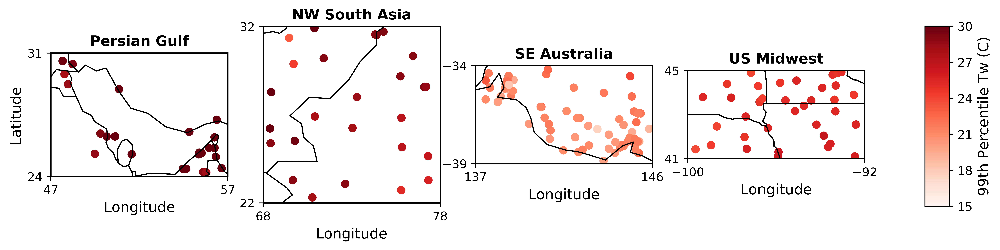

In [17]:
# Plot individual regions
fig, axs = plt.subplots(1,4, figsize = (14,7), facecolor = 'w', edgecolor = 'k', subplot_kw = {'projection': ccrs.PlateCarree()}, dpi = 1200)

# Plot CME
axs[0].coastlines(linewidth=1)
axs[0].set_xlim(CME_lon[0],CME_lon[1])
axs[0].set_ylim(CME_lat[0],CME_lat[1])
axs[0].set_xticks([CME_lon[0],CME_lon[1]], crs=ccrs.PlateCarree())
axs[0].set_yticks([CME_lat[0],CME_lat[1]], crs=ccrs.PlateCarree())
axs[0].add_feature(cfeature.BORDERS.with_scale('110m'))
axs[0].set_ylabel('Latitude', fontsize = 12)
axs[0].set_xlabel('Longitude', fontsize = 12)
axs[0].set_title('Persian Gulf', fontweight = 'bold')

scat1 = axs[0].scatter(CME_highTw['stnlons'],CME_highTw['stnlats'], c = CME_highTw['99th percentile Tw'], vmin = 15, vmax = 30, cmap = 'Reds', zorder = 1)

#NWSA
axs[1].coastlines(linewidth=1)
axs[1].set_xlim(NW_lon[0],NW_lon[1])
axs[1].set_ylim(NW_lat[0],NW_lat[1])
axs[1].set_xticks([NW_lon[0],NW_lon[1]], crs=ccrs.PlateCarree())
axs[1].set_yticks([NW_lat[0],NW_lat[1]], crs=ccrs.PlateCarree())
axs[1].add_feature(cfeature.BORDERS.with_scale('110m'))
axs[1].set_xlabel('Longitude', fontsize = 12)
axs[1].set_title('NW South Asia', fontweight = 'bold')

scat1 = axs[1].scatter(NW_df['stnlons'],NW_df['stnlats'], c = NW_df['99th percentile Tw'], vmin = 15, vmax = 30, cmap = 'Reds', zorder = 1)

# SE Australia
axs[2].coastlines(linewidth=1)
axs[2].set_xlim(SEaus_lon[0],SEaus_lon[1])
axs[2].set_ylim(SEaus_lat[0],SEaus_lat[1])
axs[2].set_xticks([SEaus_lon[0],SEaus_lon[1]], crs=ccrs.PlateCarree())
axs[2].set_yticks([SEaus_lat[0],SEaus_lat[1]], crs=ccrs.PlateCarree())
axs[2].add_feature(cfeature.BORDERS.with_scale('110m'))
axs[2].set_xlabel('Longitude', fontsize = 12)
axs[2].set_title('SE Australia', fontweight = 'bold')

scat1 = axs[2].scatter(SEaust_df['stnlons'],SEaust_df['stnlats'], c = SEaust_df['99th percentile Tw'], vmin = 15, vmax = 30, cmap = 'Reds', zorder = 1)

# Midwest
axs[3].coastlines(linewidth=1)
axs[3].set_xlim(mw_lon[0],mw_lon[1])
axs[3].set_ylim(mw_lat[0],mw_lat[1])
axs[3].set_xticks([mw_lon[0],mw_lon[1]], crs=ccrs.PlateCarree())
axs[3].set_yticks([mw_lat[0],mw_lat[1]], crs=ccrs.PlateCarree())
axs[3].add_feature(cfeature.BORDERS.with_scale('110m'))
axs[3].add_feature(cfeature.STATES.with_scale('110m'))
axs[3].set_xlabel('Longitude', fontsize = 12)
axs[3].set_title('US Midwest', fontweight = 'bold')

scat1 = axs[3].scatter(mw_df['stnlons'],mw_df['stnlats'], c = mw_df['99th percentile Tw'], vmin = 15, vmax = 30, cmap = 'Reds', zorder = 1)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.35, 0.02, 0.3])
cbar = plt.colorbar(scat1, cax=cbar_ax)

tick_locator = ticker.MaxNLocator(nbins=5)
cbar.locator = tick_locator
cbar.update_ticks()
cbar.set_label('99th Percentile Tw (C)', fontsize = 12)

plt.savefig('figure1b.png')

plt.show()

# Figure 2

In [18]:
# Load single station data
NW_data = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/NWSouthAsia_matcheddates_withdates.csv", index_col = 0, delimiter = '\t')
mw_data = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/Midwest_matcheddates_withdates.csv", index_col = 0, delimiter = '\t')
SEaust_data = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/SEaust_matcheddates_withdates.csv", index_col = 0, delimiter = '\t')
CMElimited_data = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/highTw_CMEstns_matcheddates_withdates.csv", index_col = 0, delimiter = '\t')

In [19]:
NW_data['Relative Humidity'] = 0.263*(1000*100)*NW_data['Simul SH']*(np.exp((17.67*NW_data['Simul T']/(NW_data['Simul T']+273.15-29.65))))**(-1);
NW_data['e_s'] = 6.11*np.exp(((2.5*10**6)/461.52)*(1/273.15 - 1/(NW_data['Simul T']+273.15)))
NW_data['e'] = NW_data['e_s']*NW_data['Relative Humidity']/100
NW_data['Saturation Deficit'] = NW_data['e_s'] - NW_data['e']

mw_data['Relative Humidity'] = 0.263*(1000*100)*mw_data['Simul SH']*(np.exp((17.67*mw_data['Simul T']/(mw_data['Simul T']+273.15-29.65))))**(-1);
mw_data['e_s'] = 6.11*np.exp(((2.5*10**6)/461.52)*(1/273.15 - 1/(mw_data['Simul T']+273.15)))
mw_data['e'] = mw_data['e_s']*mw_data['Relative Humidity']/100
mw_data['Saturation Deficit'] = mw_data['e_s'] - mw_data['e']

SEaust_data['Relative Humidity'] = 0.263*(1000*100)*SEaust_data['Simul SH']*(np.exp((17.67*SEaust_data['Simul T']/(SEaust_data['Simul T']+273.15-29.65))))**(-1);
SEaust_data['e_s'] = 6.11*np.exp(((2.5*10**6)/461.52)*(1/273.15 - 1/(SEaust_data['Simul T']+273.15)))
SEaust_data['e'] = SEaust_data['e_s']*SEaust_data['Relative Humidity']/100
SEaust_data['Saturation Deficit'] = SEaust_data['e_s'] - SEaust_data['e']

CMElimited_data['Relative Humidity'] = 0.263*(1000*100)*CMElimited_data['Simul SH']*(np.exp((17.67*CMElimited_data['Simul T']/(CMElimited_data['Simul T']+273.15-29.65))))**(-1);
CMElimited_data['e_s'] = 6.11*np.exp(((2.5*10**6)/461.52)*(1/273.15 - 1/(CMElimited_data['Simul T']+273.15)))
CMElimited_data['e'] = CMElimited_data['e_s']*CMElimited_data['Relative Humidity']/100
CMElimited_data['Saturation Deficit'] = CMElimited_data['e_s'] - CMElimited_data['e']

In [22]:
# Four new locations
colors = ['#287733','#88CCEE','#CC6677','#332288']
var = ['Wet Bulb','Simul T','Simul SH','Relative Humidity']
data = [CMElimited_data,NW_data,SEaust_data,mw_data]
xlabels = ['Wet Bulb (C)','Temperature (C)','Specific Humidity (g/kg)','Relative Humidity (%)']
labels = ['Persian Gulf','NW South Asia','SE Australia','US Midwest']

line1 = Line2D([0], [0], color=colors[0], linestyle = 'solid')
line2 = Line2D([0], [0], color=colors[1], linestyle = 'solid')
line3 = Line2D([0], [0], color=colors[2], linestyle = 'solid')
line4 = Line2D([0], [0], color=colors[3], linestyle = 'solid')

fig, axs = plt.subplots(2,2, figsize=(12,10), facecolor='w', edgecolor='k', dpi = 1200)

for i, ax in enumerate(fig.axes):
    
    variable = var[i]
    
    for j in range(len(labels)):
        
        if i == 2:
            data_reg = data[j]*1000
            
        else:
            data_reg = data[j]
    
        n, bins, patches = ax.hist(data_reg[variable], 20, density=True, color=colors[j], alpha = 0.15)
        n0, bins0, patches0 = ax.hist(data_reg[variable], 20, density=True, edgecolor=colors[j], histtype = 'step', linewidth = 2)

        ax.set_xlabel(xlabels[i])
        ax.set_ylabel('Weighted Counts')
        
        if i == 0:
            ax.legend([line1,line2,line3,line4], labels)
            
        if i < 3:
            ax.set_ylim([0,0.2])
            ax.set_yticks([0,0.05,0.1,0.15,0.2])
            
plt.savefig('figure2.png')

plt.show()

# Figure 3

In [12]:
# Load regional data
NW_data = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/NWSouthAsia_matcheddates_withdates.csv", index_col = 0, delimiter = '\t')
mw_data = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/Midwest_matcheddates_withdates.csv", index_col = 0, delimiter = '\t')
SEaust_data = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/SEaust_matcheddates_withdates.csv", index_col = 0, delimiter = '\t')
CMElimited_data = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/highTw_CMEstns_matcheddates_withdates.csv", index_col = 0, delimiter = '\t')

In [13]:
NW_data['Relative Humidity'] = 0.263*(1000*100)*NW_data['Simul SH']*(np.exp((17.67*NW_data['Simul T']/(NW_data['Simul T']+273.15-29.65))))**(-1);
NW_data['e_s'] = 6.11*np.exp(((2.5*10**6)/461.52)*(1/273.15 - 1/(NW_data['Simul T']+273.15)))
NW_data['e'] = NW_data['e_s']*NW_data['Relative Humidity']/100
NW_data['Saturation Deficit'] = NW_data['e_s'] - NW_data['e']

mw_data['Relative Humidity'] = 0.263*(1000*100)*mw_data['Simul SH']*(np.exp((17.67*mw_data['Simul T']/(mw_data['Simul T']+273.15-29.65))))**(-1);
mw_data['e_s'] = 6.11*np.exp(((2.5*10**6)/461.52)*(1/273.15 - 1/(mw_data['Simul T']+273.15)))
mw_data['e'] = mw_data['e_s']*mw_data['Relative Humidity']/100
mw_data['Saturation Deficit'] = mw_data['e_s'] - mw_data['e']

SEaust_data['Relative Humidity'] = 0.263*(1000*100)*SEaust_data['Simul SH']*(np.exp((17.67*SEaust_data['Simul T']/(SEaust_data['Simul T']+273.15-29.65))))**(-1);
SEaust_data['e_s'] = 6.11*np.exp(((2.5*10**6)/461.52)*(1/273.15 - 1/(SEaust_data['Simul T']+273.15)))
SEaust_data['e'] = SEaust_data['e_s']*SEaust_data['Relative Humidity']/100
SEaust_data['Saturation Deficit'] = SEaust_data['e_s'] - SEaust_data['e']

CMElimited_data['Relative Humidity'] = 0.263*(1000*100)*CMElimited_data['Simul SH']*(np.exp((17.67*CMElimited_data['Simul T']/(CMElimited_data['Simul T']+273.15-29.65))))**(-1);
CMElimited_data['e_s'] = 6.11*np.exp(((2.5*10**6)/461.52)*(1/273.15 - 1/(CMElimited_data['Simul T']+273.15)))
CMElimited_data['e'] = CMElimited_data['e_s']*CMElimited_data['Relative Humidity']/100
CMElimited_data['Saturation Deficit'] = CMElimited_data['e_s'] - CMElimited_data['e']

## Prepare all plotting elements

In [27]:
from scipy.interpolate import griddata

def grid(x, y, z, resX=1000, resY=1000):
    #prepare to create grid
    xi = np.linspace(min(x), max(x), resX)
    yi = np.linspace(min(y), max(y), resY)

    #grid x, y, z
    X, Y = np.meshgrid(xi, yi)
    Z = griddata((x, y), z, (X, Y), method='linear')
    return X, Y, Z

# Generate temperature range (in degrees C)
N_steps = 500

min_temp = -10
max_temp = 65

temp = np.linspace(min_temp,max_temp,N_steps)

# Generate specific humidity range (in kg/kg)
min_q = 0
max_q = 0.06

q = np.linspace(min_q, max_q, N_steps)

# Make gridded arrays
temp_grid, q_grid = np.meshgrid(temp, q) 
RH_grid = 0.263*(1000*100)*q_grid*(np.exp((17.67*temp_grid/(temp_grid+273.15-29.65))))**(-1);

pres = 1000*100 # set general surface pressure to 1000 hPa
pres_grid = np.ones_like(temp_grid)*pres

Twb,Teq,epott = WetBulb.WetBulb(temp_grid, pres_grid, q_grid, HumidityMode = 0)

e_s = 6.11*np.exp(((2.5*(10**6))/461.52)*((1/273.15) - (1/(temp_grid+273.15)))) #saturation vapor pressure in hPa
e = e_s*RH_grid/100 #vapor pressure in hPa
sat_def = e_s - e #in hPa

stick_TW = stickiness(temp_grid,q_grid)

In [28]:
temp_array = temp_grid.flatten(order = 'C')
q_array = q_grid.flatten(order = 'C')
spice_array = stick_TW.flatten(order = 'C')
TW_array = Twb.flatten(order = 'C')
RH_array = RH_grid.flatten(order = 'C')
SD_array = sat_def.flatten(order = 'C')
es_array = e_s.flatten(order = 'C')

data = pd.DataFrame({'Temperature': temp_array, 'Specific Humidity': q_array, 'Relative Humidity': RH_array, 'Wet Bulb': TW_array, 'Spice': spice_array, 'Saturation Deficit': SD_array, 'e_s': es_array})

In [29]:
# Find saturation line
data_CC_SD = data[(data['Saturation Deficit'] <= 0.01) & (data['Saturation Deficit'] >= -0.01)]
data_CC_RH = data[(data['Relative Humidity'] <= 100.1) & (data['Relative Humidity'] >= 99.9)]

# Find lower bound (sat def = es)
data_lb = data[data['Saturation Deficit'] == data['e_s']]
data_real = data[(data['Saturation Deficit'] <= data['e_s']) & (data['Saturation Deficit'] >= 0)]

temp, spec_hum,TW_shifted = grid(data['Temperature'], 1000*data['Specific Humidity'], data['Wet Bulb'], resX=1000, resY=1000)
wet_bulb, spec_hum, T_shifted = grid(data['Wet Bulb'], 1000*data['Specific Humidity'], data['Temperature'], resX=1000, resY=1000)

In [39]:
import string

cont_col = ['#287733','#88CCEE','#CC6677','#332288']
line3 = Line2D([0], [0], color=cont_col[0], linestyle = 'solid', linewidth = 4, alpha = 0.65)
line4 = Line2D([0], [0], color=cont_col[1], linestyle = 'solid', linewidth = 4, alpha = 0.65)
line5 = Line2D([0], [0], color=cont_col[2], linestyle = 'solid', linewidth = 4, alpha = 0.65)
line6 = Line2D([0], [0], color=cont_col[3], linestyle = 'solid', linewidth = 4, alpha = 0.65)
labels = ['Persian Gulf','NW South Asia','SE Australia','US Midwest'] #'Gaussian KDE','Tw Isotherms',
reg_data = [CMElimited_data, NW_data, SEaust_data, mw_data]
contourshading_alpha = 0.65
markersize = 50
marker = 'P'

fig, axs = plt.subplots(3,2, figsize=(15,15), facecolor='w', edgecolor='k', dpi = 1200)

######## T vs. q space
levels = np.arange(0.002,0.01+0.002,0.002)

data = pd.DataFrame({'Temperature': temp_array, 'Specific Humidity': q_array, 'Relative Humidity': RH_array, 'Wet Bulb': TW_array, 'Spice': spice_array, 'Saturation Deficit': SD_array, 'e_s': es_array})
temp, spec_hum,TW_shifted = grid(data['Temperature'], 1000*data['Specific Humidity'], data['Wet Bulb'], resX=1000, resY=1000)
wet_bulb, spec_hum, T_shifted = grid(data['Wet Bulb'], 1000*data['Specific Humidity'], data['Temperature'], resX=1000, resY=1000)

xgrid = np.linspace(0, 55, 50)
ygrid = np.linspace(0, 40, 50)
Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)

TW_cont = axs[0,0].contour(temp, spec_hum, TW_shifted, cmap = 'Greys', zorder = 1)
manual_locations = [(5, 2.5), (15, 5), (40, 2.5), (50, 10), (50,25)]
cont_lab = axs[0,0].clabel(TW_cont, inline=1, fontsize=10,fmt = '%1d',manual=manual_locations, inline_spacing = 2)

shading = axs[0,0].fill_between(data_CC_SD['Temperature'], 1000*data_CC_SD['Specific Humidity'], 100, color='white', alpha=1, zorder = 2)
shading = axs[0,0].fill_between(data_CC_SD['Temperature'], 1000*data_CC_SD['Specific Humidity'], 100, color='grey', alpha=.25, zorder = 3)
axs[0,0].set_xlim([0,55])
axs[0,0].set_ylim([0,40])
axs[0,0].set_ylabel('Specific Humidity (g/kg)')
axs[0,0].set_xlabel('Temperature (C)')
axs[0,0].legend([line3,line4,line5,line6],labels, loc = 2, borderpad = 1)

axs[0,0].text(0, 42, string.ascii_lowercase[0], size=20, weight='bold')

        
# Iterate through regions
for i in range(len(cont_col)):
    
    # Create colormap for background shading

    large_color = cont_col[i]

    cmap_cont = LinearSegmentedColormap.from_list('mycmap', [large_color,'white'])

    reg = reg_data[i]
    data = np.vstack([reg['Simul T'], 1000*reg['Simul SH']])
    kde = gaussian_kde(data)
    samples = np.vstack([Xgrid.ravel(), Ygrid.ravel()])
    Z = kde.evaluate(samples)
    
    # Find local maxima
    maxima_index = Z.argmax()
    maxima = samples[:,maxima_index]

    # Plot the result as an image
    cont1 = axs[0,0].contourf(Xgrid, Ygrid, Z.reshape(Xgrid.shape), cmap = cmap_cont, levels = levels, zorder = 4, alpha = contourshading_alpha)

    center = axs[0,0].scatter(maxima[0],maxima[1], s = markersize, marker= marker, color=large_color, zorder = 10)
    
###### Tw vs. q space
xgrid = np.linspace(-5, 40, 50)
ygrid = np.linspace(0, 40, 50)
Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)

temp_contour = axs[0,1].contour(wet_bulb, spec_hum, T_shifted, cmap = 'Greys', zorder = 1)
manual_locations = [(-3, 2), (2.5, 2), (7.5, 2), (12, 2), (15,2), (36,35), (38, 35)]
cont_lab = axs[0,1].clabel(temp_contour, inline=1, fontsize=10,fmt = '%1d',manual=manual_locations, inline_spacing = 2)

shading = axs[0,1].fill_between(data_CC_RH['Wet Bulb'], 1000*data_CC_RH['Specific Humidity'], 100, color='white', alpha=1, zorder = 2)
shading = axs[0,1].fill_between(data_CC_RH['Wet Bulb'], 1000*data_CC_RH['Specific Humidity'], 100, color='grey', alpha=.25, zorder = 3)
axs[0,1].set_xlim([-5,40])
axs[0,1].set_ylim([0,40])
axs[0,1].set_ylabel('Specific Humidity (g/kg)')
axs[0,1].set_xlabel('Wet Bulb (C)')

axs[0,1].text(-5, 42, string.ascii_lowercase[1], size=20, weight='bold')
        
# Iterate through regions
for i in range(len(cont_col)):
    
    # Create colormap for background shading

    large_color = cont_col[i]

    cmap_cont = LinearSegmentedColormap.from_list('mycmap', [large_color,'white'])

    reg = reg_data[i]
    data = np.vstack([reg['Wet Bulb'], 1000*reg['Simul SH']])
    kde = gaussian_kde(data)
    samples = np.vstack([Xgrid.ravel(), Ygrid.ravel()])
    Z = kde.evaluate(samples)
    
    # Find local maxima
    maxima_index = Z.argmax()
    maxima = samples[:,maxima_index]

    # Plot the result as an image
    cont2 = axs[0,1].contourf(Xgrid, Ygrid, Z.reshape(Xgrid.shape), cmap = cmap_cont, levels = levels, zorder = 4, alpha = contourshading_alpha)

    center = axs[0,1].scatter(maxima[0],maxima[1], s = markersize, marker= marker, color=large_color, zorder = 10)

###### T vs. RH space
data = pd.DataFrame({'Temperature': temp_array, 'Specific Humidity': q_array, 'Relative Humidity': RH_array, 'Wet Bulb': TW_array, 'Spice': spice_array, 'Saturation Deficit': SD_array, 'e_s': es_array})
temp_RH,rel_hum_RH,TW_shifted_RH = grid(data['Temperature'], data['Relative Humidity'], data['Wet Bulb'], resX=1000, resY=1000)
wet_bulb_RH, rel_hum_RH, T_shifted_RH = grid(data['Wet Bulb'], data['Relative Humidity'], data['Temperature'], resX=1000, resY=1000)

levels = np.arange(0.0005,0.004,0.0005)

xgrid = np.linspace(0, 55, 50)
ygrid = np.linspace(0, 100, 50)
Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)

TW_cont = axs[1,0].contour(temp_RH, rel_hum_RH, TW_shifted_RH, cmap = 'Greys', zorder = 1)
manual_locations = [(5, 40), (20, 15), (35, 20), (50, 10), (51,25), (53,45)]
cont_lab = axs[1,0].clabel(TW_cont, inline=1, fontsize=10,fmt = '%1d',manual=manual_locations, inline_spacing = 2)

shading = axs[1,0].fill_between(data_CC_SD['Temperature'], data_CC_SD['Relative Humidity'], 100, color='grey', alpha=.25, zorder = 4)
axs[1,0].set_xlim([0,55])
axs[1,0].set_ylim([0,100])
axs[1,0].set_ylabel('Relative Humidity (%)')
axs[1,0].set_xlabel('Temperature (C)')

axs[1,0].text(0, 104, string.ascii_lowercase[2], size=20, weight='bold')
        
# Iterate through regions
for i in range(len(cont_col)):
    
    # Create colormap for background shading

    large_color = cont_col[i]

    cmap_cont = LinearSegmentedColormap.from_list('mycmap', [large_color,'white'])

    reg = reg_data[i]
    data = np.vstack([reg['Simul T'], reg['Relative Humidity']])
    kde = gaussian_kde(data)
    samples = np.vstack([Xgrid.ravel(), Ygrid.ravel()])
    Z = kde.evaluate(samples)
    
    # Find local maxima
    maxima_index = Z.argmax()
    maxima = samples[:,maxima_index]

    # Plot the result as an image
    cont3 = axs[1,0].contourf(Xgrid, Ygrid, Z.reshape(Xgrid.shape), cmap = cmap_cont, levels = levels, zorder = 3, alpha = contourshading_alpha)

    center = axs[1,0].scatter(maxima[0],maxima[1], s = markersize, marker= marker, color=large_color, zorder = 10)
        
###### Tw vs. RH space

TW_cont = axs[1,1].contour(wet_bulb_RH, rel_hum_RH, T_shifted_RH, cmap = 'Greys', zorder = 1)
manual_locations = [(2.5, 20), (7.5, 20), (12.5, 10), (35, 70), (36,40), (37,25)]
cont_lab = axs[1,1].clabel(TW_cont, inline=1, fontsize=10,fmt = '%1d',manual=manual_locations, inline_spacing = 2)

shading = axs[1,1].fill_between(data_CC_SD['Wet Bulb'], data_CC_SD['Relative Humidity'], 100, color='grey', alpha=.25, zorder = 4)
axs[1,1].set_xlim([-5,40])
axs[1,1].set_ylim([0,100])
axs[1,1].set_ylabel('Relative Humidity (%)')
axs[1,1].set_xlabel('Wet Bulb (C)')

axs[1,1].text(-5, 104, string.ascii_lowercase[3], size=20, weight='bold')
        
# Iterate through regions
for i in range(len(cont_col)):
    
    # Create colormap for background shading

    large_color = cont_col[i]

    cmap_cont = LinearSegmentedColormap.from_list('mycmap', [large_color,'white'])

    reg = reg_data[i]
    data = np.vstack([reg['Wet Bulb'], reg['Relative Humidity']])
    kde = gaussian_kde(data)
    samples = np.vstack([Xgrid.ravel(), Ygrid.ravel()])
    Z = kde.evaluate(samples)
    
    # Find local maxima
    maxima_index = Z.argmax()
    maxima = samples[:,maxima_index]

    # Plot the result as an image
    cont3 = axs[1,1].contourf(Xgrid, Ygrid, Z.reshape(Xgrid.shape), cmap = cmap_cont, levels = levels, zorder = 3, alpha = contourshading_alpha)

    center = axs[1,1].scatter(maxima[0],maxima[1], s = markersize, marker= marker, color=large_color, zorder = 10)

###### T vs. saturation deficit space
data = pd.DataFrame({'Temperature': temp_array, 'Specific Humidity': q_array, 'Relative Humidity': RH_array, 'Wet Bulb': TW_array, 'Spice': spice_array, 'Saturation Deficit': SD_array, 'e_s': es_array})
data_posSD = data[data['Saturation Deficit'] >= 0]

temp_SD,sat_def,TW_shifted_SD = grid(data_posSD['Temperature'], data_posSD['Saturation Deficit'], data_posSD['Wet Bulb'], resX=1000, resY=1000)
temp_SD_RH,sat_def_RH,RH_shifted_SD = grid(data_posSD['Temperature'], data_posSD['Saturation Deficit'], data_posSD['Relative Humidity'], resX=1000, resY=1000)
wet_bulb_SD, sat_def, T_shifted_SD = grid(data_posSD['Wet Bulb'], data_posSD['Saturation Deficit'], data_posSD['Temperature'], resX=1000, resY=1000)
wet_bulb_SD, sat_def, RH_shiftedTW_SD = grid(data_posSD['Wet Bulb'], data_posSD['Saturation Deficit'], data_posSD['Relative Humidity'], resX=1000, resY=1000)

RH_cont_TW = plt.contour(wet_bulb_SD, sat_def, RH_shiftedTW_SD, cmap = 'Blues', zorder = 0, alpha = 0);
RH_cont = plt.contour(temp_SD_RH, sat_def_RH, RH_shifted_SD, cmap = 'Blues', zorder = 0, alpha = 0);

levels = np.arange(0.0002,0.007+0.002,0.001)

RH_100cont = RH_cont.allsegs[0][0]

xgrid = np.linspace(0, 55, 50)
ygrid = np.linspace(0, 140, 20)
Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)

TW_cont = axs[2,0].contour(temp_SD, sat_def, TW_shifted_SD, cmap = 'Greys', zorder = 1)
manual_locations = [(3, 5), (12, 5), (20, 10), (50, 120), (50,60)]
cont_lab = axs[2,0].clabel(TW_cont, inline=1, fontsize=10,fmt = '%1d',manual=manual_locations, inline_spacing = 2)

shading1 = axs[2,0].fill_between(RH_100cont[:,0],RH_100cont[:,1], 600,color='white', zorder = 2)
shading = axs[2,0].fill_between(RH_100cont[:,0],RH_100cont[:,1], 600,color='grey', alpha=.25, zorder = 5)
axs[2,0].set_xlim([0,55])
axs[2,0].set_ylim([0,140])
axs[2,0].set_ylabel('Saturation Deficit (hPa)')
axs[2,0].set_xlabel('Temperature (C)')

axs[2,0].text(0, 144, string.ascii_lowercase[4], size=20, weight='bold')

y1 = np.array([[10,10], [10,140], [25,140], [25,60]])
p1 = Polygon(y1, facecolor = 'white')

y2 = np.array([[26,32], [26,140], [35,140], [35,60]])
p2 = Polygon(y2, facecolor = 'white')

y3 = np.array([[48.25,120], [48.25,140], [51.5,140], [51.5,130]])
p3 = Polygon(y3, facecolor = 'white')
        
# Iterate through regions
for i in range(len(cont_col)):
    
    # Create colormap for background shading

    large_color = cont_col[i]

    cmap_cont = LinearSegmentedColormap.from_list('mycmap', [large_color,'white'])

    reg = reg_data[i]
    data = np.vstack([reg['Simul T'], reg['Saturation Deficit']])
    kde = gaussian_kde(data)
    samples = np.vstack([Xgrid.ravel(), Ygrid.ravel()])
    Z = kde.evaluate(samples)
    
    # Find local maxima
    maxima_index = Z.argmax()
    maxima = samples[:,maxima_index]

    # Plot the result as an image
    cont3 = axs[2,0].contourf(Xgrid, Ygrid, Z.reshape(Xgrid.shape), cmap = cmap_cont, levels = levels, zorder = 3, alpha = contourshading_alpha)

    center = axs[2,0].scatter(maxima[0],maxima[1], s = markersize, marker= marker, color=large_color, zorder = 10)
        
###### Tw vs. saturation deficit space

RH_100cont = RH_cont_TW.allsegs[0][0]

xgrid = np.linspace(0, 55, 50)
ygrid = np.linspace(0, 140, 20)
Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)

T_cont = axs[2,1].contour(wet_bulb_SD, sat_def, T_shifted_SD, cmap = 'Greys', zorder = 1)
manual_locations = [(-2.5, 2), (2.5, 8), (7.5, 20), (12, 40), (16,75), (20,120)]
cont_lab = axs[2,1].clabel(T_cont, inline=1, fontsize=10,fmt = '%1d',manual=manual_locations, inline_spacing = 2)

shading = axs[2,1].fill_between(RH_100cont[:,0],RH_100cont[:,1], 600,color='white', alpha= 1, zorder = 2)
shading = axs[2,1].fill_between(RH_100cont[:,0],RH_100cont[:,1], 600,color='grey', alpha=.25, zorder = 3)
axs[2,1].set_xlim([-5,40])
axs[2,1].set_ylim([0,140])
axs[2,1].set_ylabel('Saturation Deficit (hPa)')
axs[2,1].set_xlabel('Wet Bulb (C)')
        
axs[2,1].text(-5, 144, string.ascii_lowercase[5], size=20, weight='bold')

# Iterate through regions
for i in range(len(cont_col)):
    
    # Create colormap for background shading

    large_color = cont_col[i]

    cmap_cont = LinearSegmentedColormap.from_list('mycmap', [large_color,'white'])

    reg = reg_data[i]
    data = np.vstack([reg['Wet Bulb'], reg['Saturation Deficit']])
    kde = gaussian_kde(data)
    samples = np.vstack([Xgrid.ravel(), Ygrid.ravel()])
    Z = kde.evaluate(samples)
    
    # Find local maxima
    maxima_index = Z.argmax()
    maxima = samples[:,maxima_index]

    # Plot the result as an image
    cont3 = axs[2,1].contourf(Xgrid, Ygrid, Z.reshape(Xgrid.shape), cmap = cmap_cont, levels = levels, zorder = 3, alpha = contourshading_alpha)

    center = axs[2,1].scatter(maxima[0],maxima[1], s = markersize, marker= marker, color=large_color, zorder = 10)

plt.savefig('figure3.png')

plt.show()

Note that the above code can also be used to generate Figures S6-S11 by plotting individual scatter plots for each subregion.

# Figure S2

In [6]:
hist_d = {'JJA_spice': dfcol['JJA_spice'], 'DJF_spice': dfcol['DJF_spice'], 'stncodes': stncodes, 'stnlats': stnlats,'stnlons': stnlons}
hist_df = pd.DataFrame(data=hist_d)

In [7]:
hist_30N = hist_df[(hist_df.stnlats > 0) & (hist_df.stnlats <= 30)]
hist_60N = hist_df[(hist_df.stnlats > 30) & (hist_df.stnlats <= 60)]
hist_90N = hist_df[(hist_df.stnlats > 60) & (hist_df.stnlats <= 90)]

hist_30S = hist_df[(hist_df.stnlats <= 0) & (hist_df.stnlats >= -30)]
hist_60S = hist_df[(hist_df.stnlats < -30) & (hist_df.stnlats >= -60)]
hist_90S = hist_df[(hist_df.stnlats < -60) & (hist_df.stnlats >= -90)]

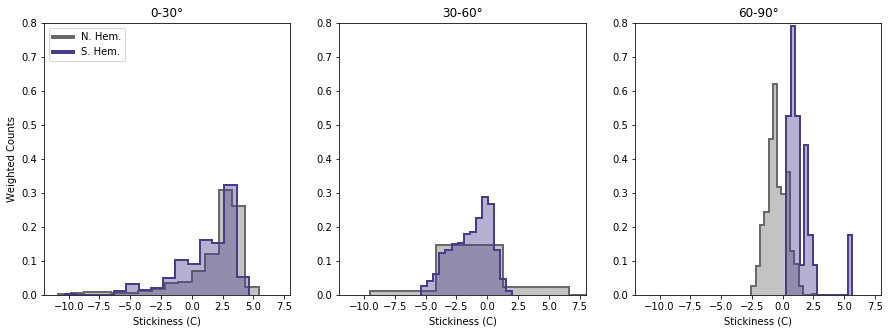

In [9]:
colors = ['dimgrey','darkslateblue']
labels = ['N. Hem.','S. Hem.']

line1 = Line2D([0], [0], color=colors[0], linestyle = 'solid', linewidth = 4)
line2 = Line2D([0], [0], color=colors[1], linestyle = 'solid', linewidth = 4)

fig, axs = plt.subplots(1,3, figsize=(15,5), facecolor='w', edgecolor='k')

n, bins, patches = axs[0].hist(hist_30N['JJA_spice'], 15, density=True, color=colors[0], alpha = 0.4)
n0, bins0, patches0 = axs[0].hist(hist_30N['JJA_spice'], 15, density=True, edgecolor=colors[0], histtype = 'step', linewidth = 2)

n, bins, patches = axs[0].hist(hist_30S['DJF_spice'], 15, density=True, color=colors[1], alpha = 0.4)
n0, bins0, patches0 = axs[0].hist(hist_30S['DJF_spice'], 15, density=True, edgecolor=colors[1], histtype = 'step', linewidth = 2)

axs[0].set_xlabel('Stickiness (C)')
axs[0].set_ylabel('Weighted Counts')
axs[0].set_title('0-30°')
axs[0].set_xlim([-12,8])
axs[0].set_ylim([0,0.8])

n, bins, patches = axs[1].hist(hist_60N['JJA_spice'], 15, density=True, color=colors[0], alpha = 0.4)
n0, bins0, patches0 = axs[1].hist(hist_60N['JJA_spice'], 15, density=True, edgecolor=colors[0], histtype = 'step', linewidth = 2)

n, bins, patches = axs[1].hist(hist_60S['DJF_spice'], 15, density=True, color=colors[1], alpha = 0.4)
n0, bins0, patches0 = axs[1].hist(hist_60S['DJF_spice'], 15, density=True, edgecolor=colors[1], histtype = 'step', linewidth = 2)

axs[1].set_xlabel('Stickiness (C)')
axs[1].set_title('30-60°')
axs[1].set_xlim([-12,8])
axs[1].set_ylim([0,0.8])

n, bins, patches = axs[2].hist(hist_90N['JJA_spice'], 15, density=True, color=colors[0], alpha = 0.4)
n0, bins0, patches0 = axs[2].hist(hist_90N['JJA_spice'], 15, density=True, edgecolor=colors[0], histtype = 'step', linewidth = 2)

n, bins, patches = axs[2].hist(hist_90S['DJF_spice'], 15, density=True, color=colors[1], alpha = 0.4)
n0, bins0, patches0 = axs[2].hist(hist_90S['DJF_spice'], 15, density=True, edgecolor=colors[1], histtype = 'step', linewidth = 2)

axs[2].set_xlabel('Stickiness (C)')
axs[2].set_title('60-90°')
axs[2].set_xlim([-12,8])
axs[2].set_ylim([0,0.8])

axs[0].legend([line1,line2], labels, loc = 'upper left')

# Figure S5

In [14]:
CME_stn1 = CMElimited_data[(CMElimited_data.index >= 4049) & (CMElimited_data.index <= 5979)]

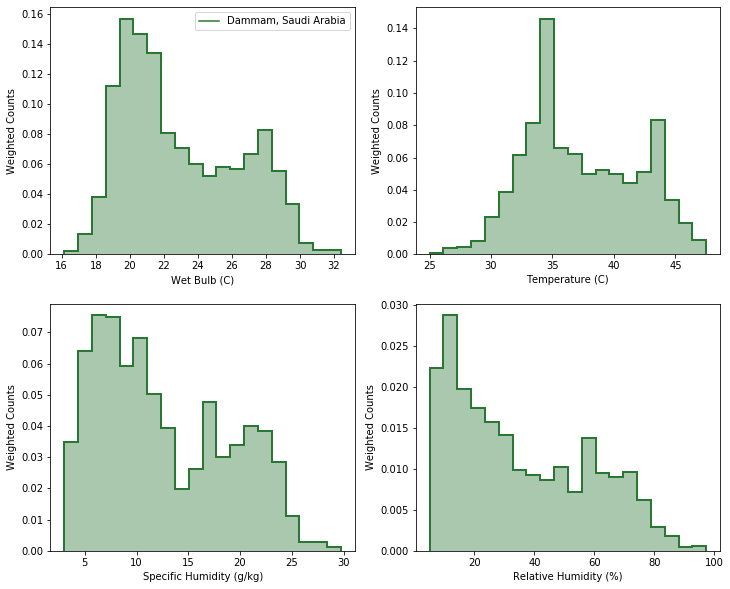

In [15]:
colors = ['#287733','#88CCEE','#CC6677','#332288']
var = ['Wet Bulb','Simul T','Simul SH','Relative Humidity']
data = [CME_stn1]
xlabels = ['Wet Bulb (C)','Temperature (C)','Specific Humidity (g/kg)','Relative Humidity (%)']
labels = ['Dammam, Saudi Arabia']

line1 = Line2D([0], [0], color=colors[0], linestyle = 'solid')
line2 = Line2D([0], [0], color=colors[1], linestyle = 'solid')
line3 = Line2D([0], [0], color=colors[2], linestyle = 'solid')
line4 = Line2D([0], [0], color=colors[3], linestyle = 'solid')

fig, ax = plt.subplots(2,2, figsize=(12,10), facecolor='w', edgecolor='k')

for i, ax in enumerate(fig.axes):
    
    variable = var[i]
    
    for j in range(len(labels)):
        
        if i == 2:
            data_reg = data[j]*1000
            
        else:
            data_reg = data[j]
    
        n, bins, patches = ax.hist(data_reg[variable], 20, density=True, color=colors[j], alpha = 0.4)
        n0, bins0, patches0 = ax.hist(data_reg[variable], 20, density=True, edgecolor=colors[j], histtype = 'step', linewidth = 2)

        ax.set_xlabel(xlabels[i])
        ax.set_ylabel('Weighted Counts')
        
        if i == 0:
            ax.legend([line1,line2,line3,line4], labels)